## **Mini Project 2 (Klasifikasi gambar)**

## Mengunduh dan menyiapkan dataset

In [3]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Unggah kaggle.json
from google.colab import files
files.upload()  # Pilih file kaggle.json yang telah diunduh

# Buat direktori kaggle dan pindahkan kaggle.json ke sana
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Instal kaggle API
!pip install kaggle

# Unduh dataset Stanford Dogs
!kaggle datasets download -d jessicali9530/stanford-dogs-dataset

# Ekstrak dataset
!unzip stanford-dogs-dataset.zip -d /content/stanford-dogs-dataset


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Streaming output truncated to the last 5000 lines.
  inflating: /content/stanford-dogs-dataset/images/Images/n02108089-boxer/n02108089_11687.jpg  
  inflating: /content/stanford-dogs-dataset/images/Images/n02108089-boxer/n02108089_117.jpg  
  inflating: /content/stanford-dogs-dataset/images/Images/n02108089-boxer/n02108089_11807.jpg  
  inflating: /content/stanford-dogs-dataset/images/Images/n02108089-boxer/n02108089_11875.jpg  
  inflating: /content/stanford-dogs-dataset/images/Images/n02108089-boxer/n02108089_122.jpg  
  inflating: /content/stanford-dogs-dataset/images/Images/n02108089-boxer/n02108089_12232.jpg  
  inflating: /content/stanford-dogs-dataset/images/Images/n02108089-boxer/n02108089_125.jpg  
  inflating: /content/stanford-dogs-dataset/images/Images/n02108089-boxer/n02108089_12738.jpg  
  inflating: /content/stanford-dogs-dataset/images/Images/n02108089-boxer/n02108089_12739.jpg  
  inflating: /content/stanford-dogs-dataset/images/Images/n02108089-boxer/n02108089_12827.j

## Menyiapkan data (Preprocessing Data)

['n02093754-Border_terrier', 'n02087394-Rhodesian_ridgeback', 'n02107312-miniature_pinscher', 'n02089078-black-and-tan_coonhound', 'n02092002-Scottish_deerhound', 'n02102480-Sussex_spaniel', 'n02102177-Welsh_springer_spaniel', 'n02104365-schipperke', 'n02090622-borzoi', 'n02100236-German_short-haired_pointer', 'n02096437-Dandie_Dinmont', 'n02110063-malamute', 'n02097047-miniature_schnauzer', 'n02096585-Boston_bull', 'n02091467-Norwegian_elkhound', 'n02106382-Bouvier_des_Flandres', 'n02099267-flat-coated_retriever', 'n02091134-whippet', 'n02111277-Newfoundland', 'n02099429-curly-coated_retriever', 'n02106030-collie', 'n02111889-Samoyed', 'n02091244-Ibizan_hound', 'n02093859-Kerry_blue_terrier', 'n02105855-Shetland_sheepdog', 'n02106550-Rottweiler', 'n02098105-soft-coated_wheaten_terrier', 'n02109047-Great_Dane', 'n02095314-wire-haired_fox_terrier', 'n02110185-Siberian_husky', 'n02113186-Cardigan', 'n02112350-keeshond', 'n02105641-Old_English_sheepdog', 'n02109525-Saint_Bernard', 'n02096

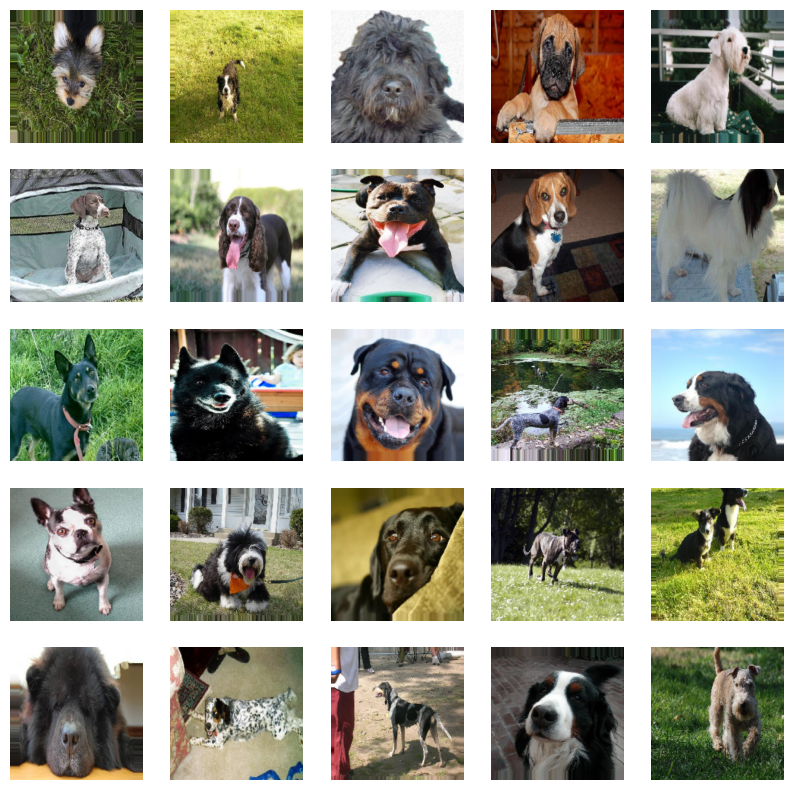

Found 20580 images belonging to 120 classes.
Found 20580 images belonging to 120 classes.


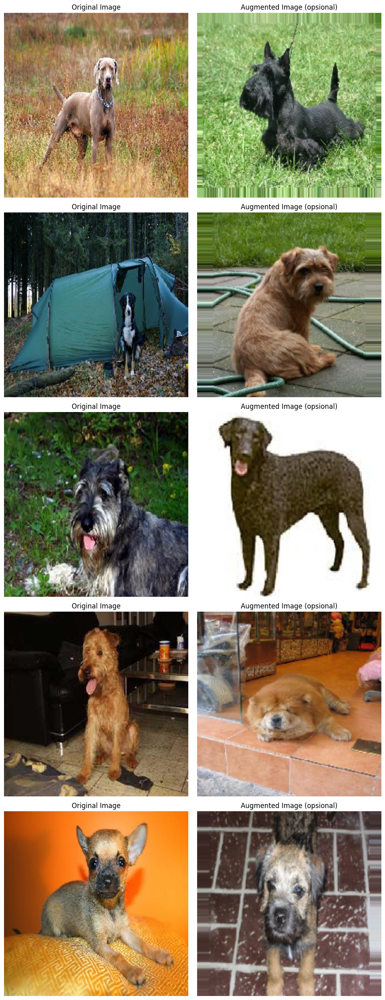

In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Path ke dataset
train_dir = '/content/stanford-dogs-dataset/images/Images'

# Memeriksa struktur direktori
print(os.listdir(train_dir))

# ImageDataGenerator untuk augmentasi gambar
train_datagen = ImageDataGenerator(rescale=1./255,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                    horizontal_flip=True,
                                   validation_split=0.2)  # Membagi data untuk validasi

# Data generator untuk training dan validasi
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=(224, 224),
                                                    batch_size=64,
                                                    class_mode='categorical',
                                                    subset='training')  # Set untuk training

valid_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=(224, 224),
                                                    batch_size=64,
                                                    class_mode='categorical',
                                                    subset='validation')  # Set untuk validasi

##Menampilkan beberapa sampel gambar secara acak dari data training
sample_images, _ = next(train_generator)

# Menampilkan 25 gambar secara acak
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i + 1)
    plt.imshow(sample_images[i])
    plt.axis('off')  # Menghilangkan sumbu x dan y
plt.show()


## Menampilkan data sebelum dan sesudah augmentasi (Opsional)
# Inisialisasi ImageDataGenerator tanpa augmentasi untuk visualisasi data asli
original_datagen = ImageDataGenerator(rescale=1./255)

# Initialize ImageDataGenerator with augmentation for augmented data visualization
augmented_datagen = ImageDataGenerator(
    rescale=1./255,
   ## rotation_range=40,
   ## width_shift_range=0.2,
    ##height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Load beberapa contoh gambar dari dataset asli
original_data_generator = original_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=1,
    class_mode=None,
    shuffle=True
)

# Load some example images from the augmented dataset
augmented_data_generator = augmented_datagen.flow_from_directory(
    train_dir,  # Use the same directory as original for augmentation
    target_size=(224, 224),
    batch_size=1,  # Set batch size to 1 to get individual images
    class_mode=None,
    shuffle=True
)
# Visualisasi beberapa contoh gambar sebelum dan sesudah augmentasi
num_images = 5

plt.figure(figsize=(10, 5*num_images))

# Visualisasi data asli
for i in range(num_images):
    original_image = next(original_data_generator)[0]
    plt.subplot(num_images, 2, 2*i+1)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')

# Visualize augmented data
for i in range(num_images):
    augmented_image = next(augmented_data_generator)[0]
    plt.subplot(num_images, 2, 2*i+2)
    plt.imshow(augmented_image)
    plt.title('Augmented Image (opsional)')
    plt.axis('off')

plt.tight_layout()
plt.show()


## Membangun model CNN (Convolutional Neural Network)

In [5]:
model = Sequential()
##layer pertama convolutional dan maxpooling
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(MaxPooling2D((2, 2)))
##layer kedua convolutional dan maxpooling
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
##layer ketiga convolutional dan maxpooling
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
##layer mengubah nilai multidimensional menjadi satu dimensi
model.add(Flatten())
##layer fully connected
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))
##layer output
model.add(Dense(120, activation='softmax'))  # Ada 120 kelas dalam dataset Stanford Dogs

model.compile(optimizer=Adam(lr=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 128)       0

## Melatih Model

In [6]:
# Callbacks untuk early stopping dan model checkpoint
early_stopping = EarlyStopping(monitor='val_loss', patience=3, verbose=1, restore_best_weights=True) ##untuk melakukan stop pelatihan jika selama pelatihan sejumlah patience, model tidak membaik
model_checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, verbose=1) ## menyimpan model terbaik berdasarkan val_loss yang membaik

# Melatih model
history = model.fit(train_generator,
                    steps_per_epoch=train_generator.samples // train_generator.batch_size,
                    validation_data=valid_generator,
                    validation_steps=valid_generator.samples // valid_generator.batch_size,
                    epochs=50,
                    callbacks=[early_stopping, model_checkpoint])


Epoch 1/50
257/257 [==============================] - ETA: 0s - loss: 4.7872 - accuracy: 0.0134
Epoch 1: val_loss improved from inf to 4.64099, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


257/257 [==============================] - 332s 1s/step - loss: 4.7872 - accuracy: 0.0134 - val_loss: 4.6410 - val_accuracy: 0.0223
Epoch 2/50
257/257 [==============================] - ETA: 0s - loss: 4.5659 - accuracy: 0.0311
Epoch 2: val_loss improved from 4.64099 to 4.51029, saving model to best_model.h5
257/257 [==============================] - 311s 1s/step - loss: 4.5659 - accuracy: 0.0311 - val_loss: 4.5103 - val_accuracy: 0.0357
Epoch 3/50
257/257 [==============================] - ETA: 0s - loss: 4.4326 - accuracy: 0.0453
Epoch 3: val_loss improved from 4.51029 to 4.40011, saving model to best_model.h5
257/257 [==============================] - 309s 1s/step - loss: 4.4326 - accuracy: 0.0453 - val_loss: 4.4001 - val_accuracy: 0.0454
Epoch 4/50
257/257 [==============================] - ETA: 0s - loss: 4.3005 - accuracy: 0.0593
Epoch 4: val_loss improved from 4.40011 to 4.31064, saving model to best_model.h5
257/257 [==============================] - 288s 1s/step - loss: 4.3005

## Evaluasi Model

63/63 [==============================] - 52s 824ms/step - loss: 3.9882 - accuracy: 0.1133
Validation Accuracy: 11.33%


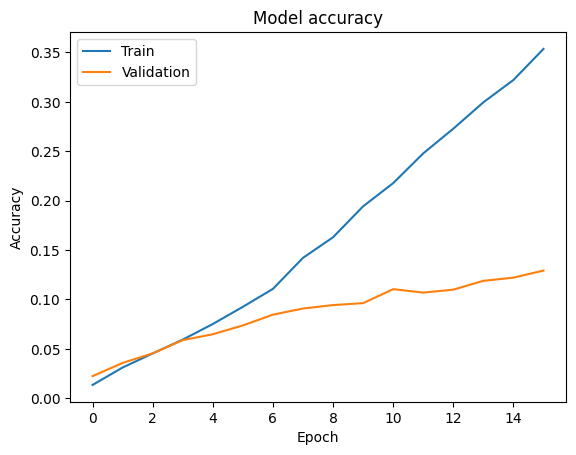

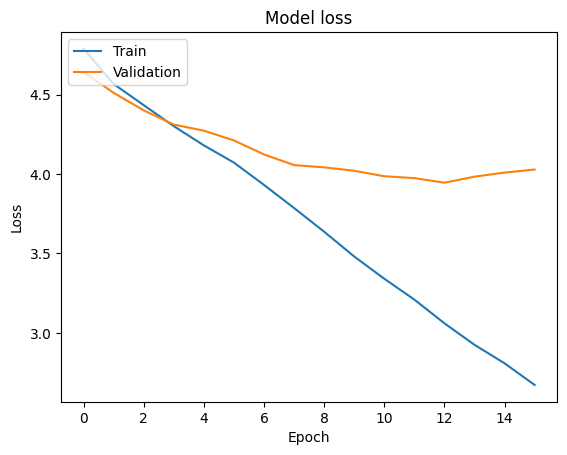

In [7]:
# Evaluasi model
loss, accuracy = model.evaluate(valid_generator, steps=valid_generator.samples // valid_generator.batch_size)
print(f'Validation Accuracy: {accuracy * 100:.2f}%')

# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

## transfer learnig bisa digunakan untuk melakukan pelatihan agar mendapatkan lebih baik

## Test Akurasi Model Klasifikasi 50 Gambar

63/63 [==============================] - 53s 840ms/step - loss: 3.9859 - accuracy: 0.1178
Validation Accuracy: 11.78%
2/2 [==============================] - 1s 375ms/step


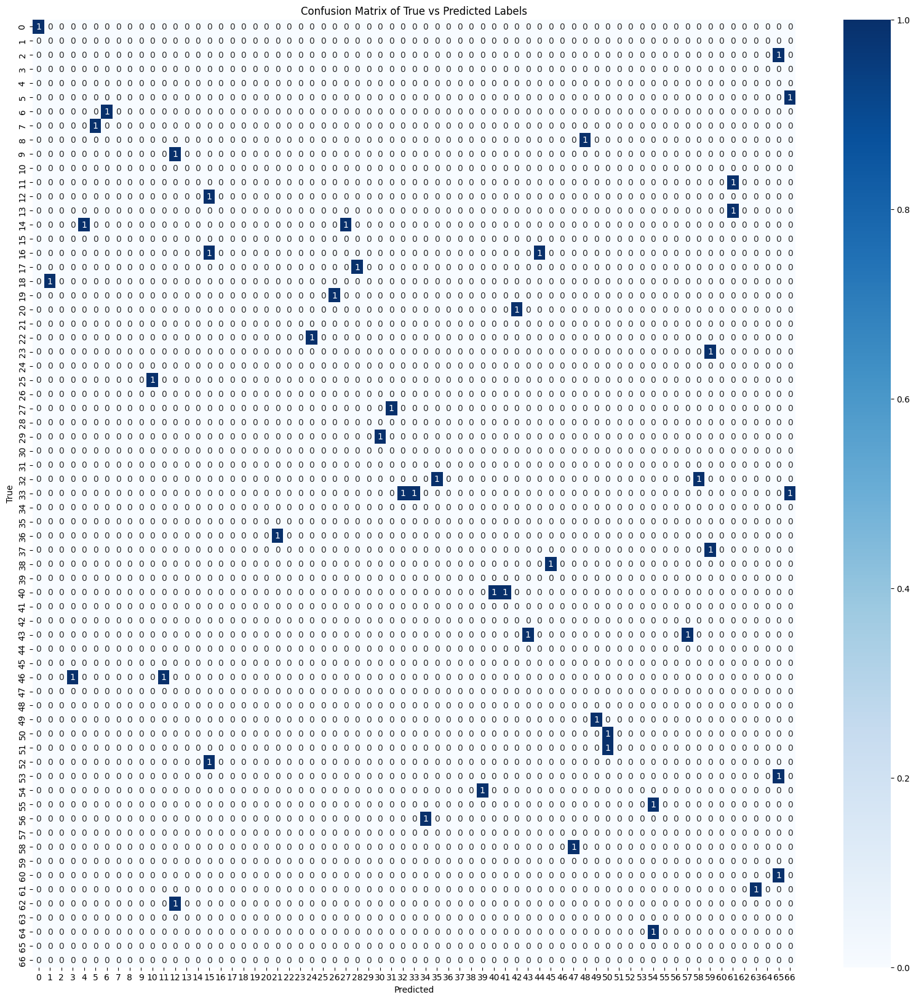

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

              precision    recall  f1-score   support

           1       1.00      1.00      1.00         1
           2       0.00      0.00      0.00         0
           4       0.00      0.00      0.00         1
           6       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         1
          12       1.00      1.00      1.00         1
          13       0.00      0.00      0.00         1
          14       0.00      0.00      0.00         1
          16       0.00      0.00      0.00         1
          19       0.00      0.00      0.00         0
          20       0.00      0.00      0.00         1
          22       0.00      0.00      0.00         1
          23       0.00      0.00      0.00         1
          24       0.00      0.00      0.00         2
          26       0.00      0.00      0.00         0
          27       0.00      0.00      0.00         2
          28       0.00    

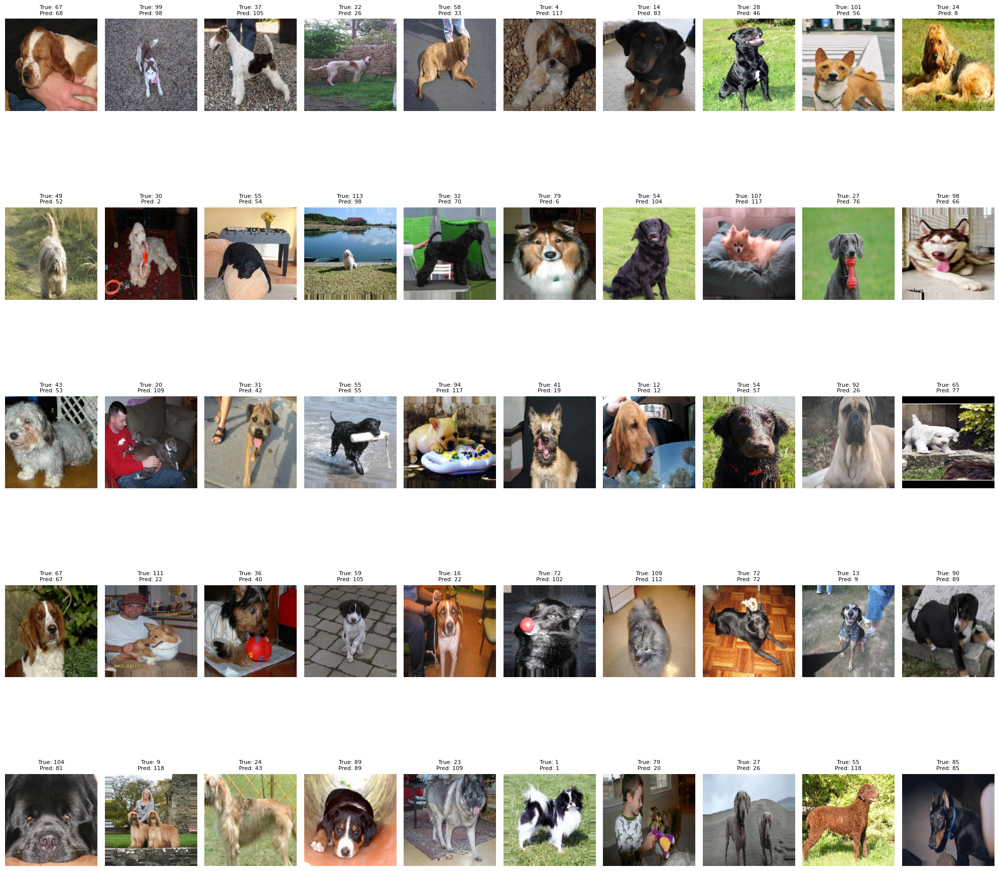

In [8]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Langkah 1: Ambil 50 gambar dari validasi generator
valid_generator.reset()  # Reset generator untuk memastikan prediksi dari awal

# Evaluasi model pada data validasi
loss, accuracy = model.evaluate(valid_generator, steps=valid_generator.samples // valid_generator.batch_size)
print(f'Validation Accuracy: {accuracy * 100:.2f}%')

x_batch, y_true = next(valid_generator)  # Ambil batch pertama
x_sample, y_sample = x_batch[:50], y_true[:50]  # Ambil 50 gambar pertama

# Langkah 2: Lakukan prediksi
y_pred_prob = model.predict(x_sample)  # Prediksi probabilitas kelas
y_pred = np.argmax(y_pred_prob, axis=1)  # Ambil kelas dengan probabilitas tertinggi
y_true = np.argmax(y_sample, axis=1)  # Konversi label one-hot ke label kelas

# Langkah 3: Tampilkan persebaran True vs Predicted
# Tampilkan confusion matrix menggunakan seaborn heatmap
conf_matrix = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(20, 20))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix of True vs Predicted Labels')
plt.show()

# Tampilkan classification report
print(classification_report(y_true, y_pred))  # Tidak perlu menyertakan target_names di sini

# Opsional: Tampilkan beberapa gambar dengan prediksi dan label aslinya
fig, axes = plt.subplots(5, 10, figsize=(20, 20))
axes = axes.flatten()
for img, true_label, pred_label, ax in zip(x_sample, y_true, y_pred, axes):
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f'True: {true_label}\nPred: {pred_label}', fontsize=8)
plt.tight_layout()
plt.show()
